In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/finaldataset.zip -d /tmp/

Streaming output truncated to the last 5000 lines.
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/ccbfedd0-e8d7-4f09-aa7b-98213e408c39___PSU_CG 2216_new30degFlipLR.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/3ecbb7b8-ad66-4944-886e-de2ae2c2c35e___PSU_CG 2095_180deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/8b43c3f3-73ae-47bc-a620-079ebeeb10a4___PSU_CG 2094_270deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/f73758a1-230b-49a7-87ae-7265232b6b67___PSU_CG 2128_270deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/8e59061b-3802-4297-8724-a001efb95268___PSU_CG 2064_180deg.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/57b10f20-7819-40b1-924c-b484c42c515f___PSU_CG 2356_newPixel25.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/6804695f-56f8-4ff9-90f8-69ee95097463___PSU_CG 2067.JPG  
  inflating: /tmp/valid/Tomato___Tomato_mosaic_virus/69d3740b-5aba-47e2-ae2f-46541333c3a5___PSU_CG 2420.JPG  
  inflating: /t

In [ ]:
import os                       # for working with files
import numpy as np              # for numerical computationss
import pandas as pd             # for working with dataframes
import torch                    # Pytorch module 
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from torch.utils.data import DataLoader # for dataloaders 
from PIL import Image           # for checking images
import seaborn as sns
import torch.nn.functional as F # for functions for calculating loss
import torchvision
import torchvision.transforms as transforms   # for transforming images into tensors 
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images
from torchsummary import summary              # for getting the summary of our model
import cv2
%matplotlib inline

In [ ]:
data_dir = "/tmp"
train_dir = data_dir + "/train"
valid_dir = data_dir + "/valid"
diseases = os.listdir(train_dir)
base_path_train =data_dir+"/train/" 
base_path_val =data_dir+"/valid/" 

In [ ]:
diseases = os.listdir(train_dir)
print("Total classes of Diseases :")
print(len(diseases))

Total classes of Diseases :
25


In [ ]:
print("Diseases in the dataset")
print(diseases)

Diseases in the dataset
['Potato___Late_blight', 'Tomato___Bacterial_spot', 'Grape___Esca_(Black_Measles)', 'Tomato___Leaf_Mold', 'Corn_(maize)___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___healthy', 'Potato___Early_blight', 'Apple___Cedar_apple_rust', 'Tomato___Late_blight', 'Potato___healthy', 'Grape___Black_rot', 'Corn_(maize)___Common_rust_', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Apple___healthy', 'Apple___Black_rot', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Tomato___Early_blight', 'Tomato___Tomato_mosaic_virus', 'Tomato___Septoria_leaf_spot']


In [ ]:
crops=[]
cnt=0
cnt_healthy=0
for i in diseases:
  s=i.split("___")
  if(s[0] not in crops):
    crops.append(s[0])
  if(s[1]=="healthy"):
    cnt_healthy+=1
  if(s[1]!="healthy"):
    cnt+=1

In [ ]:
print("Crops Names are as below:")
for i in crops:
  print(f"{crops.index(i)+1}]{i}")

Crops Names are as below:
1]Potato
2]Tomato
3]Grape
4]Corn_(maize)
5]Apple


In [ ]:
print("Number of Crops :")
print(cnt_healthy)
print("Number of Diseases to be identified :")
print(cnt)

Number of Crops :
5
Number of Diseases to be identified :
20


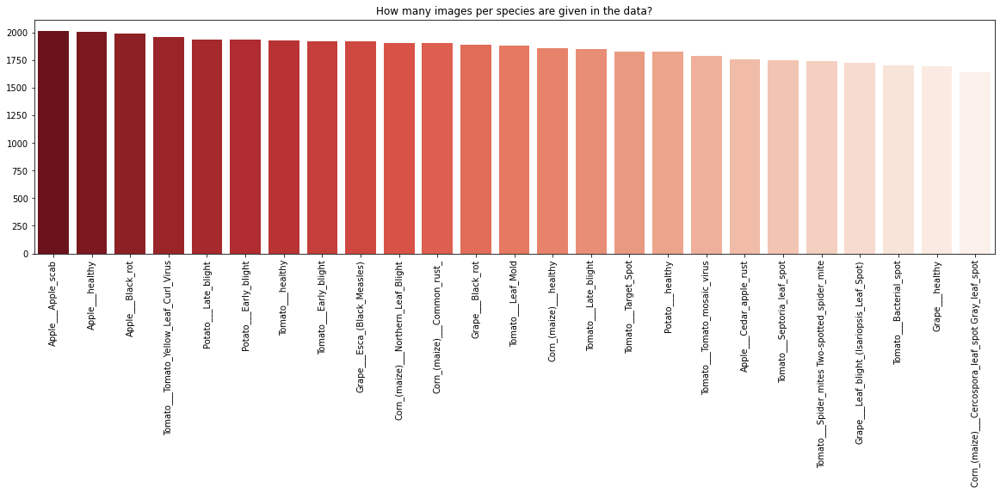

In [ ]:
subfolders = os.listdir(base_path_train)
names = []
counts = []

for folder in subfolders:
    images = os.listdir(base_path_train +folder)
    names.append(folder)
    counts.append(len(images))

counts = np.array(counts)
names = np.array(names)

idx = np.argsort(counts)[::-1]
    
plt.figure(figsize=(20,5))    
sns.barplot(x=names[idx], y=counts[idx], palette="Reds_r")
plt.xticks(rotation=90);
plt.title("How many images per species are given in the data?");



total_images = 0
for folder in subfolders:
    total_images += len(os.listdir(base_path_train + folder))

plantstate = pd.DataFrame(index=np.arange(0, total_images), columns=["width", "height", "species"])

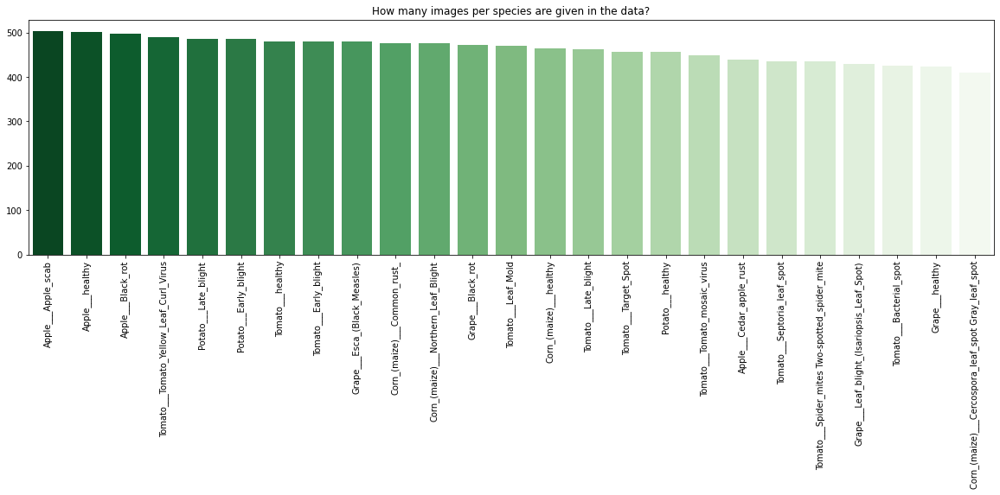

In [ ]:
subfolders = os.listdir(base_path_val)
names = []
counts = []

for folder in subfolders:
    images = os.listdir(base_path_val +folder)
    names.append(folder)
    counts.append(len(images))

counts = np.array(counts)
names = np.array(names)

idx = np.argsort(counts)[::-1]
    
plt.figure(figsize=(20,5))    
sns.barplot(x=names[idx], y=counts[idx], palette="Greens_r")
plt.xticks(rotation=90);
plt.title("How many images per species are given in the data?");



total_images = 0
for folder in subfolders:
    total_images += len(os.listdir(base_path_val + folder))

plantstate = pd.DataFrame(index=np.arange(0, total_images), columns=["width", "height", "species"])

Text(0.5, 1.0, 'distribution of pixels')

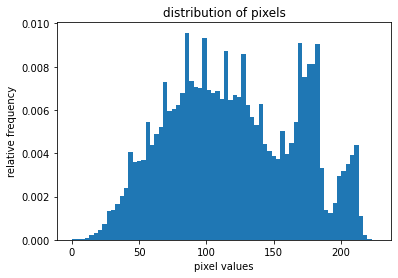

In [ ]:
# load the image
img_path = '/tmp/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG'
img = Image.open(img_path)

# convert PIL image to numpy array
img_np = np.array(img)

# plot the pixel values
plt.hist(img_np.ravel(), bins=70, density=True)
plt.xlabel("pixel values")
plt.ylabel("relative frequency")
plt.title("distribution of pixels")

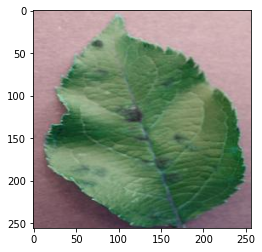

In [ ]:
imgg=cv2.imread('/tmp/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG')
plt.imshow(imgg)

Text(0.5, 1.0, 'distribution of pixels')

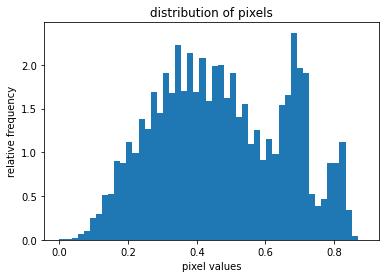

In [ ]:
# define custom transform function
transform = transforms.Compose([
	transforms.ToTensor()
])

# transform the pIL image to tensor
# image
img_tr = transform(img)

# Convert tensor image to numpy array
img_np = np.array(img_tr)

# plot the pixel values
plt.hist(img_np.ravel(), bins=50, density=True)
plt.xlabel("pixel values")
plt.ylabel("relative frequency")
plt.title("distribution of pixels")

In [ ]:
img_tr = transform(img)
 
# calculate mean and std
mean, std = img_tr.mean([1,2]), img_tr.std([1,2])
 
# print mean and std
print("mean and std before normalize:")
print("Mean of the image:", mean)
print("Std of the image:", std)

mean and std before normalize:
Mean of the image: tensor([0.4340, 0.5105, 0.4700])
Std of the image: tensor([0.1756, 0.1385, 0.2256])


Text(0.5, 1.0, 'distribution of pixels')

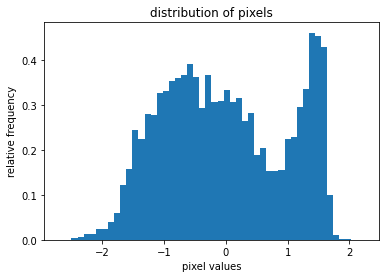

In [ ]:
transform_norm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])
 
# get normalized image
img_normalized = transform_norm(img)
 
# convert normalized image to numpy
# array
img_np = np.array(img_normalized)
 
# plot the pixel values
plt.hist(img_np.ravel(), bins=50, density=True)
plt.xlabel("pixel values")
plt.ylabel("relative frequency")
plt.title("distribution of pixels")

([], [])

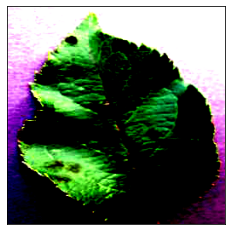

In [ ]:
img_normalized = transform_norm(img)
 
# convert this image to numpy array
img_normalized = np.array(img_normalized)
 
# transpose from shape of (3,,) to shape of (,,3)
img_normalized = img_normalized.transpose(1, 2, 0)
 
# display the normalized image
plt.imshow(img_normalized)
plt.xticks([])
plt.yticks([])

In [ ]:
dataset = torchvision.datasets.ImageFolder(root=train_dir, transform=transforms.ToTensor())
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, num_workers=2)

# Initialize variables to accumulate the mean and standard deviation
mean = 0.
std = 0.
n_images = 0

# Iterate over batches of images and accumulate mean and std
for images, _ in dataloader:
    batch_size = images.size(0)
    images = images.view(batch_size, images.size(1), -1)
    mean += images.mean(2).sum(0)
    std += images.std(2).sum(0)
    n_images += batch_size

# Calculate the overall mean and standard deviation of the dataset
mean /= n_images
std /= n_images

print(f"Mean: {mean}")
print(f"Standard deviation: {std}")

Mean: tensor([0.4616, 0.4866, 0.4177])
Standard deviation: tensor([0.1824, 0.1604, 0.1982])


In [ ]:
random_seed = 7
torch.manual_seed(random_seed)

In [ ]:
train_transform_n = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
     transforms.ToTensor(),
     transforms.Normalize(
       mean,std
    ),
   
   
])
train_data_n =ImageFolder(
  root=train_dir, transform=train_transform_n
)
train_loader_n = DataLoader(
  train_data_n, 
  batch_size=32, 
  shuffle=True, 
  num_workers=2,
  pin_memory=True
)

In [ ]:
valid_transform_n = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(
       mean,std
    ),
    
    
])
valid_data_n =ImageFolder(
  root=valid_dir, transform=valid_transform_n
)
valid_dl = DataLoader(valid_data_n, batch_size, num_workers=2, pin_memory=True)

Normalized image 


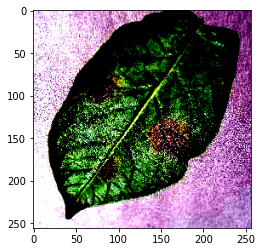

In [ ]:
images, labels = next(iter(train_loader_n))

def display_image(images):
  images_np = images.numpy()
  img_plt = images_np.transpose(0,2,3,1)
  # display 5th image from dataset
  plt.imshow(img_plt[4])
print("Normalized image ")
display_image(images)

In [ ]:
def show_batch(data):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(35, 35))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break

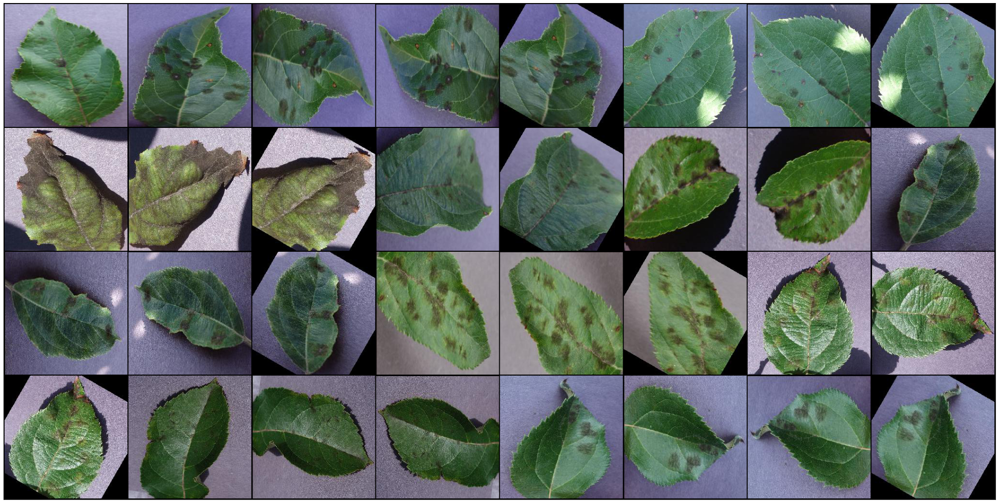

In [ ]:
show_batch(dataloader) 

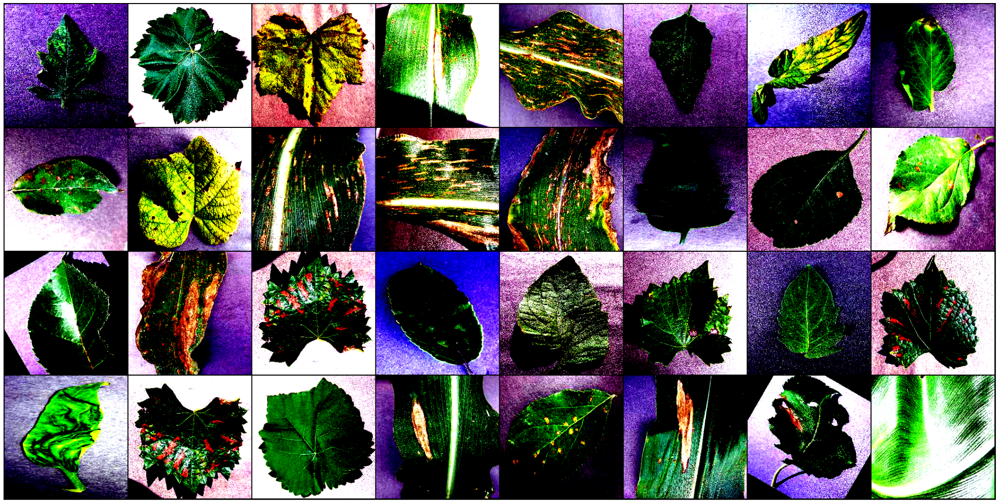

In [ ]:
show_batch(train_loader_n) 

In [ ]:
img, label = train_data_n[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_loader_n = DeviceDataLoader(train_loader_n, device)
valid_dl = DeviceDataLoader(valid_dl, device)

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [ ]:
# base class for the model
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                   # Generate prediction
        loss = F.cross_entropy(out, labels)  # Calculate loss
        acc = accuracy(out, labels)          # Calculate accuracy
        return {"val_loss": loss.detach(), "val_accuracy": acc}
    
    def validation_epoch_end(self, outputs):
        batch_losses = [x["val_loss"] for x in outputs]
        batch_accuracy = [x["val_accuracy"] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()       # Combine loss  
        epoch_accuracy = torch.stack(batch_accuracy).mean()
        return {"val_loss": epoch_loss, "val_accuracy": epoch_accuracy} # Combine accuracies
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_accuracy']))
        

In [ ]:
def cnn_without_pooling(input_channels,output_channels):
    kernel_size=3;
    padding=1;
    layers = []
    layers.append(nn.Conv2d(input_channels, output_channels, kernel_size, padding=1))
    layers.append(nn.BatchNorm2d(output_channels))
    layers.append(nn.ReLU(inplace=True))
    return nn.Sequential(*layers)


def cnn_with_pooling(input_channels, output_channels):
    kernel_size=3;
    padding=1;
    layers = [nn.Conv2d(input_channels, output_channels, kernel_size, padding=1),
             nn.BatchNorm2d(output_channels),
             nn.ReLU(inplace=True),
             nn.MaxPool2d(4)]
    return nn.Sequential(*layers)

In [ ]:
# resnet architecture 
class ResNet_9(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv_block1 = cnn_without_pooling(in_channels, 64)
        self.conv_block2 = cnn_with_pooling(64, 128) # out_dim : 128 x 64 x 64 
        self.residual_block1 = nn.Sequential(cnn_without_pooling(128, 128),cnn_without_pooling(128, 128))
        
        self.conv_block3 =  cnn_with_pooling(128, 256) # out_dim : 256 x 16 x 16
        self.conv_block4 =  cnn_with_pooling(256, 512) # out_dim : 512 x 4 x 44
        self.residual_block2 = nn.Sequential(cnn_without_pooling(512, 512),cnn_without_pooling(512, 512))
        
        self.fc = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))
        
    def forward(self, input):
        output = self.conv_block1(input)
        output = self.conv_block2(output)
        output = self.residual_block1(output) + output
        output = self.conv_block3(output)
        output = self.conv_block4(output)
        output = self.residual_block2(output) + output
        output = self.fc(output)
        return output  

In [ ]:
model = to_device(ResNet_9(3, 25), device) 
model

ResNet_9(
  (conv_block1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv_block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (residual_block1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

In [ ]:
# getting summary of the model
INPUT_SHAPE = (3, 256, 256)
print(summary(model.cuda(), (INPUT_SHAPE)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]          73,856
       BatchNorm2d-5        [-1, 128, 256, 256]             256
              ReLU-6        [-1, 128, 256, 256]               0
         MaxPool2d-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]         147,584
       BatchNorm2d-9          [-1, 128, 64, 64]             256
             ReLU-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]         147,584
      BatchNorm2d-12          [-1, 128, 64, 64]             256
             ReLU-13          [-1, 128, 64, 64]               0
           Conv2d-14          [-1, 256,

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    

def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
            
    
        # validation
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history

In [ ]:
%%time
history = [evaluate(model, valid_dl)]
history

CPU times: user 45.9 s, sys: 2.83 s, total: 48.7 s
Wall time: 1min


[{'val_loss': tensor(3.2211, device='cuda:0'), 'val_accuracy': tensor(0.0378)}]

In [ ]:
epochs = 5
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [ ]:
%%time
history += fit_OneCycle(epochs, max_lr, model, train_loader_n, valid_dl, 
                             grad_clip=grad_clip, 
                             weight_decay=1e-4, 
                             opt_func=opt_func)

Epoch [0], last_lr: 0.00760, train_loss: 0.7099, val_loss: 0.7113, val_acc: 0.7939
Epoch [1], last_lr: 0.00950, train_loss: 0.3294, val_loss: 0.8885, val_acc: 0.7712
Epoch [2], last_lr: 0.00611, train_loss: 0.2329, val_loss: 0.2044, val_acc: 0.9316
Epoch [3], last_lr: 0.00188, train_loss: 0.1245, val_loss: 0.0660, val_acc: 0.9790
Epoch [4], last_lr: 0.00000, train_loss: 0.0337, val_loss: 0.0212, val_acc: 0.9934
CPU times: user 26min 32s, sys: 25min 59s, total: 52min 31s
Wall time: 56min 20s


In [ ]:
k=history[0]
k['val_loss']

tensor(3.2211, device='cuda:0')

In [ ]:
def plot_accuracies(history):
    accuracies = [x['val_accuracy'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');


def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    train_losses = [loss for loss in train_losses if loss is not None] # Filter out None values
    val_losses = [x['val_loss'].cpu() for x in history]
    val_losses = [loss for loss in val_losses if loss is not None] # Filter out None values
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')

    
def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.'); 

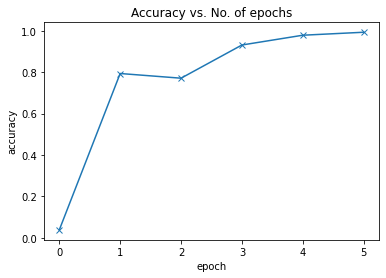

In [ ]:
plot_accuracies(history)

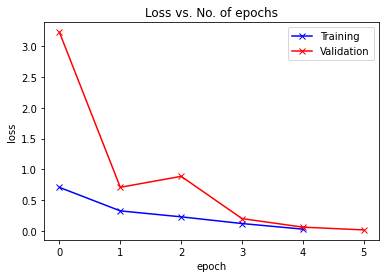

In [ ]:
plot_losses(history)

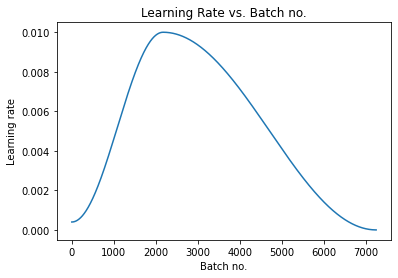

In [ ]:
plot_lrs(history)

<Axes: >

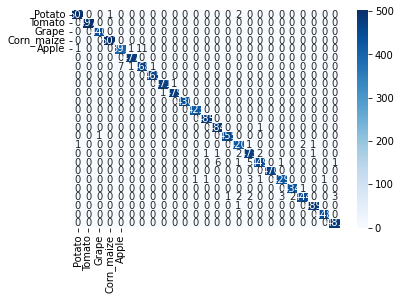

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming you have test_loader and model defined already

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
model.eval()
class_crops = ['Potato','Tomato','Grape','Corn_maize','Apple']
y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in valid_dl:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred += predicted.tolist()

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=class_crops, yticklabels=class_crops)


<Axes: >

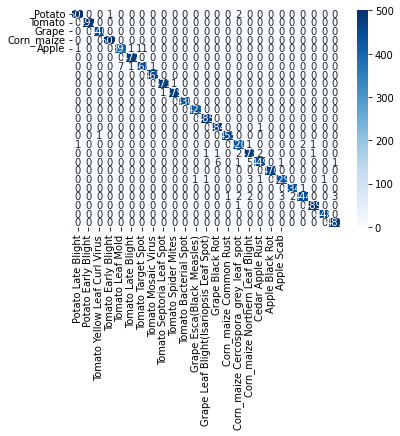

In [ ]:
class_crops = ['Potato','Tomato','Grape','Corn_maize','Apple']
class_diseases = ['Potato Late Blight','Potato Early Blight','Tomato Yellow Leaf Curl Virus','Tomato Early Blight','Tomato Leaf Mold','Tomato Late Blight','Tomato Target Spot','Tomato Mosaic Virus','Tomato Septoria Leaf Spot','Tomato Spider Mites','Tomato Bacterial Spot','Grape Esca(Black_Measles)','Grape Leaf Blight(Isariopsis Leaf Spot)','Grape Black Rot','Corn_maize Common Rust','Corn_maize Cercospora_grey_leaf_spot','Corn_maize Northern Leaf Blight','Cedar Apple Rust','Apple Black Rot','Apple Scab']
y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in valid_dl:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred += predicted.tolist()

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=class_diseases, yticklabels=class_crops)

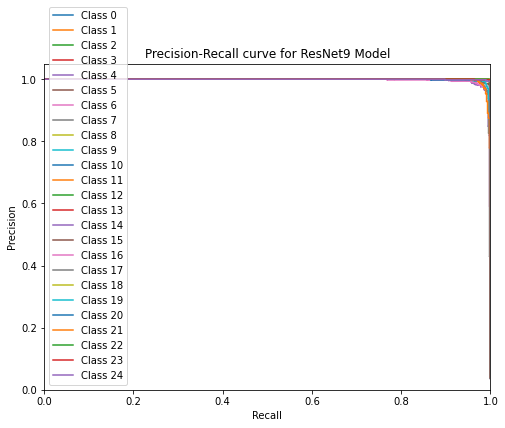

In [ ]:
import torch
import numpy as np
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
#from resnet import ResNet9 # assuming you have a ResNet9 implementation in a module called resnet

# Assuming you have the validation dataset (val_dataset) and a trained ResNet9 model (model)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

y_true = []
y_pred = []

with torch.no_grad():
    for inputs, targets in valid_dl:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        probs = torch.softmax(outputs, dim=1)
        y_true.append(targets.cpu().numpy())
        y_pred.append(probs.cpu().numpy())

y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

# Compute precision-recall for each class separately
precision = dict()
recall = dict()
n_classes = y_true.max() + 1
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_true == i, y_pred[:, i], pos_label=1)

# Plot the precision-recall curves for each class
plt.figure(figsize=(8, 6))
plt.step(recall[0], precision[0], where='post', label='Class 0')
for i in range(1, n_classes):
    plt.step(recall[i], precision[i], where='post', label='Class %i' % i)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve for ResNet9 Model')
plt.legend(loc="lower left")


In [ ]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]

In [ ]:
torch.save(model.state_dict(), 'ResNet9_final.pth')

In [ ]:
torch.save({
    'epoch': 5,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': opt_func,
}, 'ResNet9_final_checkpoint.pth')


In [ ]:
torch.save(model.state_dict(), '/content/drive/My Drive/ResNet9_final.pth')

In [ ]:
import pickle
# Dump the trained ResNet9 with Pickle
ResNet9_pkl_filename = '/content/drive/My Drive/ResNet9_final_model.pkl'
# Open the file to save as pkl file
ResNet9_Model_pkl = open(ResNet9_pkl_filename, 'wb')
pickle.dump(ResNet_9, ResNet9_Model_pkl)
# Close the pickle instances
ResNet9_Model_pkl.close()

<Axes: >

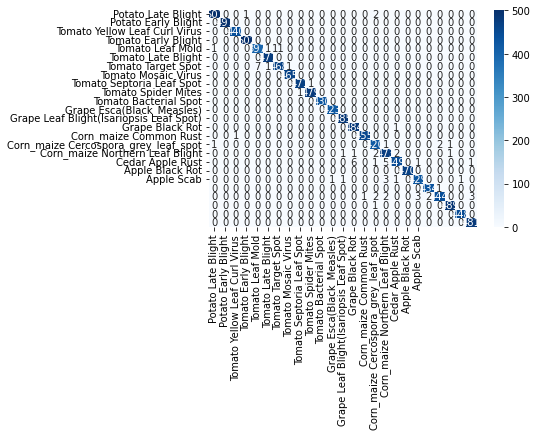

In [ ]:
# class_diseases = ['Potato Late Blight','Potato Early Blight','Tomato Yellow Leaf Curl Virus','Tomato Early Blight','Tomato Leaf Mold','Tomato Late Blight','Tomato Target Spot','Tomato Mosaic Virus','Tomato Septoria Leaf Spot','Tomato Spider Mites','Tomato Bacterial Spot','Grape Esca(Black_Measles)','Grape Leaf Blight(Isariopsis Leaf Spot)','Grape Black Rot','Corn_maize Common Rust','Corn_maize Cercospora_grey_leaf_spot','Corn_maize Northern Leaf Blight','Cedar Apple Rust','Apple Black Rot','Apple Scab']
# y_true = []
# y_pred = []

# with torch.no_grad():
#     for images, labels in valid_dl:
#         images, labels = images.to(device), labels.to(device)
#         outputs = model(images)
#         _, predicted = torch.max(outputs.data, 1)
#         y_true += labels.tolist()
#         y_pred += predicted.tolist()

# cm = confusion_matrix(y_true, y_pred)
# sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=class_diseases, yticklabels=class_diseases)

# import seaborn as sns
# from sklearn.metrics import confusion_matrix

# class_diseases = ['Potato Late Blight','Potato Early Blight','Tomato Yellow Leaf Curl Virus','Tomato Early Blight','Tomato Leaf Mold','Tomato Late Blight','Tomato Target Spot','Tomato Mosaic Virus','Tomato Septoria Leaf Spot','Tomato Spider Mites','Tomato Bacterial Spot','Grape Esca(Black_Measles)','Grape Leaf Blight(Isariopsis Leaf Spot)','Grape Black Rot','Corn_maize Common Rust','Corn_maize Cercospora_grey_leaf_spot','Corn_maize Northern Leaf Blight','Cedar Apple Rust','Apple Black Rot','Apple Scab']

# y_true = []
# y_pred = []

# with torch.no_grad():
#     for images, labels in valid_dl:
#         images, labels = images.to(device), labels.to(device)
#         outputs = model(images)
#         _, predicted = torch.max(outputs.data, 1)
#         y_true += labels.tolist()
#         y_pred += predicted.tolist()

# cm = confusion_matrix(y_true, y_pred)
import seaborn as sns
from sklearn.metrics import confusion_matrix

class_diseases = ['Potato Late Blight','Potato Early Blight','Tomato Yellow Leaf Curl Virus','Tomato Early Blight','Tomato Leaf Mold','Tomato Late Blight','Tomato Target Spot','Tomato Mosaic Virus','Tomato Septoria Leaf Spot','Tomato Spider Mites','Tomato Bacterial Spot','Grape Esca(Black_Measles)','Grape Leaf Blight(Isariopsis Leaf Spot)','Grape Black Rot','Corn_maize Common Rust','Corn_maize Cercospora_grey_leaf_spot','Corn_maize Northern Leaf Blight','Cedar Apple Rust','Apple Black Rot','Apple Scab']

y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in valid_dl:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred += predicted.tolist()

cm = confusion_matrix(y_true, y_pred)

sns.set(font_scale=1.5)  # increase font size
plt.figure(figsize=(15, 12))  # increase figure size
sns.heatmap(cm, annot=True, cmap='RdBu', fmt='g', xticklabels=class_diseases, yticklabels=class_diseases)
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.show()


sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=class_diseases, yticklabels=class_diseases)
